# Velocity profiles

In [1]:
import os
import sys
import gc
import ast
import math as m
import numpy as np
import scipy
import pandas as pd
from scipy import *
from matplotlib.cm import viridis
from matplotlib.colors import Normalize
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np
import pylab
from scipy import special
import matplotlib.pyplot as plt
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (11, 6),
         'axes.labelsize': 33,
         'axes.titlesize':33,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

pylab.rcParams.update(params)
sys.path.append('/projects/DEIKE/cmartinb/functions')

# Funciones y clases personalizadas
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 

os.chdir('/projects/DEIKE/cmartinb/')

In [2]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p16' # 0p16 
uoc = '0p50' # 0p50 0p75
reW = '2.5e4' #1.0e5
reA = 720
maxLevel = 10
Bo=200

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

if uoc == '0p75':
    N = 1024
else:
    N = 512 

#Common parameters 
kp = 4
u = 0.25
lambdap = 2*m.pi/kp

L0 = 2*np.pi;

ak, c, omegap, nu_water, g , uoc_val= calculate_parameters(kpHs, uoc , u ,kp)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)
cp = np.sqrt(g/kp)
T0 = lambdap/cp
omegap = 2*m.pi/T0

rho = 1
rho_air = 1.25 /1000

ak is 0.16 c is 0.5 w_p$ is 2.0 $
u_w$ is 3.141592653589793e-05 g is 1 N 512


In [ ]:
work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'

data = np.loadtxt(work_dir+'profiles/log_pro.out')

istep_c_vel =data[:, 1]
time_vel = data[:,0] 
print((time_vel-time_vel[0])* omegap / (2 * np.pi))

In [4]:
#phi    u.x     u.y     u.z     p       omega   uv      duy     diss    ke      vke     dkdy 

In [5]:
# Filename to save
save_filename = f'/projects/DEIKE/cmartinb/processed_profiles/processed_profiles_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv'

# Check if the file already exists
if not os.path.exists(save_filename):

    log_filename = work_dir + 'profiles/log_pro.out'
    data_field = np.loadtxt(log_filename)

    # Columns of the DataFrame
    columns = ['time', 'istep', 'phi', 'u.x', 'u.y', 'u.z', 'p', 'omega', 'uv', 'duy', 'diss', 'ke', 'vke', 'dkdy']

    all_profiles = []

    # Loop through the step indices
    for idx, row in enumerate(data_field):
        time_step = row[0]
        istep = int(row[1])

        filename = work_dir + f'profiles/prof_{istep:09}.out'
        profile_data = np.loadtxt(filename)

        profile_dict = {'time': time_step, 'istep': istep}
        for col_idx, col_name in enumerate(columns[2:]):  # Start at 2 to skip 'time' and 'istep'
            profile_dict[col_name] = profile_data[:, col_idx].tolist()  # Convert to list to avoid issues with pandas

        all_profiles.append(profile_dict)

    profiles_df = pd.DataFrame(all_profiles)
    profiles_df.to_csv(save_filename, index=False)
else:

    profiles_df = pd.read_csv(save_filename)
    print(f"The file {save_filename} already exists. DataFrame loaded from the file.")


The file /projects/DEIKE/cmartinb/processed_profiles/processed_profiles_re720_bo0200_P0p16_uoc0p50_reW2.5e4_L10.csv already exists. DataFrame loaded from the file.


In [6]:
# Define the columns of the DataFrame
columns = ['time', 'istep', 'phi', 'u.x', 'u.y', 'u.z', 'p', 'omega', 'uv', 'duy', 'diss', 'ke', 'vke', 'dkdy']

In [7]:
tstart_vel = time_vel[0]
print(profiles_df.shape)

indice = np.argmax(omegap * (time_vel - tstart_vel) > 10)

profiles_df_trimmed = profiles_df.iloc[indice:].reset_index(drop=True)
print(profiles_df_trimmed.shape)
profiles_df_trimmed.to_csv(f'/projects/DEIKE/cmartinb/processed_profiles/processed_profiles_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}_trimmed.csv', index=False)
profiles_df = profiles_df_trimmed


(623, 14)
(597, 14)


In [8]:
tstart_vel = profiles_df['time'][0]

Try to divide interval time like the otehr time interval for spectra study

In [9]:
vector = np.array(profiles_df['time']-tstart_vel)* omegap / (2 * np.pi)

In [10]:
Tp = 2*np.pi/omegap

In [11]:
time_normalized = (time_vel - time_vel[0]) * omegap / (2 * np.pi)

### Velocity in all the time interval

In [12]:
# Air limits
xlim_air = [-1, 20]
ylim_air = [-0.5, 2.5]

# Water limits
xlim_water = [-0.01, 0.2]
ylim_water = [-0.5, 0]

figsize = (10, 5)  # Fig size

# Ajustes de los márgenes
left_margin = 0.15
right_margin = 0.85
top_margin = 0.9
bottom_margin = 0.2

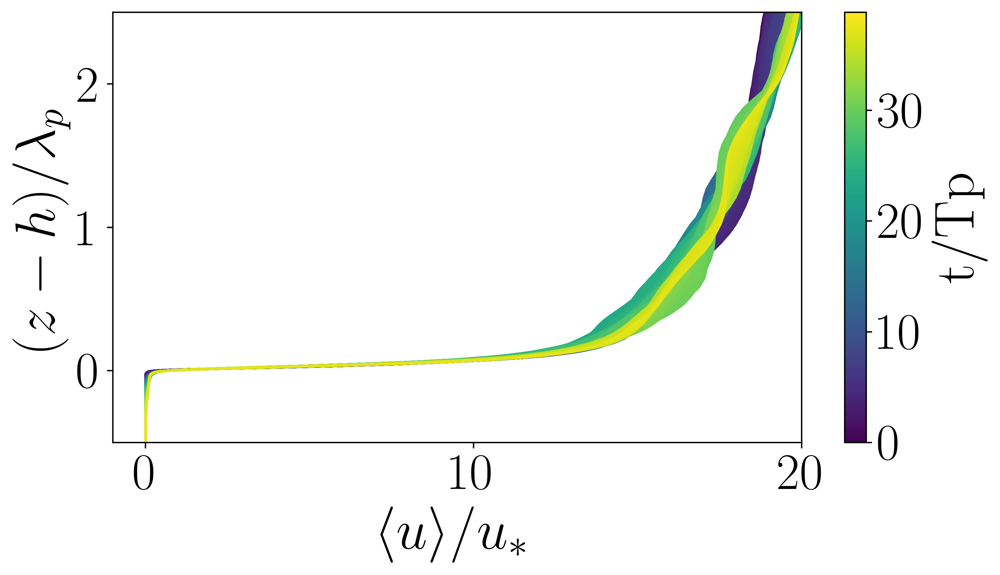

In [13]:
fig, ax = plt.subplots(figsize=figsize)

plt.subplots_adjust(left=left_margin, right=right_margin, top=top_margin, bottom=bottom_margin)

norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array(time_normalized)  

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))

    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    ax.plot(u_z_array/u, (phi_array-1)/norm, color=color)


cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t/Tp')

plt.xlim(xlim_air)
plt.ylim(ylim_air)

plt.ylabel(r'$(z-h)/\lambda_{p}$')
plt.xlabel(r'$\langle u\rangle / u_{\ast}$')

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/kpHs{kpHs}uoc{uoc}_velocityair.png', dpi=300, bbox_inches='tight')
plt.show()


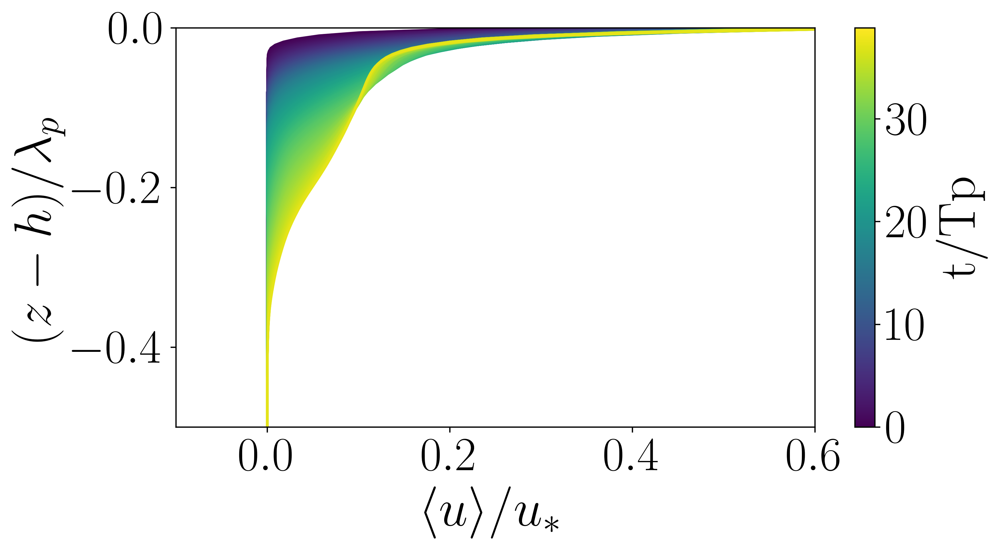

In [14]:
fig, ax = plt.subplots(figsize=figsize)

plt.subplots_adjust(left=left_margin, right=right_margin, top=top_margin, bottom=bottom_margin)

norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array(time_normalized) 

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))

    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    
    ax.plot(u_z_array/u, (phi_array-1)/norm, color=color)


cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t/Tp')

plt.xlim([-0.1, 0.6])
plt.ylim(ylim_water)

plt.ylabel(r'$(z-h)/\lambda_{p}$')
plt.xlabel(r'$\langle u\rangle / u_{\ast}$')

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/kpHs{kpHs}uoc{uoc}_velocitywater.png', dpi=300, bbox_inches='tight')
plt.show()


### Velocity profile in each interval

In [15]:
tstart_vel = profiles_df['time'].iloc[0]

time_normalized = (profiles_df['time'] - tstart_vel) * omegap / (2 * np.pi)

target = 4.66
idx_closest = np.argmin(np.abs(time_normalized - target))

interval_length = time_normalized.iloc[idx_closest] - time_normalized.iloc[0]

intervals = []

start_idx = 0
end_idx = idx_closest
intervals.append((start_idx, end_idx))

overlap_fraction = 0.5
step_size = int((1 - overlap_fraction) * (end_idx - start_idx))
    
overlap_fraction = 0.5
while end_idx < len(time_normalized) - 1:
    start_idx = int(end_idx - overlap_fraction * idx_closest)
    end_idx = start_idx + idx_closest
    if end_idx >= len(time_normalized):
        end_idx = len(time_normalized) - 1
    if time_normalized[end_idx] < (time_normalized[end_idx]-1):
        break
    intervals.append((start_idx, end_idx))
    
    

for i, (start, end) in enumerate(intervals):
    print(f"Interval {i + 1}: {time_normalized.iloc[start]:.4f}t/T_p to {time_normalized.iloc[end]:.4f}t/T_p")

pd.reset_option('display.max_rows')



Interval 1: 0.0000t/T_p to 4.6875t/T_p
Interval 2: 2.3125t/T_p to 7.0000t/T_p
Interval 3: 4.6250t/T_p to 9.3125t/T_p
Interval 4: 6.9375t/T_p to 11.6250t/T_p
Interval 5: 9.2500t/T_p to 13.9375t/T_p
Interval 6: 11.5625t/T_p to 16.2500t/T_p
Interval 7: 13.8750t/T_p to 18.5625t/T_p
Interval 8: 16.1875t/T_p to 20.8750t/T_p
Interval 9: 18.5000t/T_p to 23.1875t/T_p
Interval 10: 20.8125t/T_p to 25.5000t/T_p
Interval 11: 23.1250t/T_p to 27.8125t/T_p
Interval 12: 25.4375t/T_p to 30.1250t/T_p
Interval 13: 27.7500t/T_p to 32.4375t/T_p
Interval 14: 30.0625t/T_p to 34.7500t/T_p
Interval 15: 32.3750t/T_p to 37.0625t/T_p
Interval 16: 34.6875t/T_p to 37.2500t/T_p


In [16]:
tstart_vel = profiles_df['time'].iloc[0]

time_normalized = (profiles_df['time'] - tstart_vel) * omegap / (2 * np.pi)


target = 4.66
idx_closest = np.argmin(np.abs(time_normalized - target))


interval_length = time_normalized.iloc[idx_closest]


intervals = []


start_idx = 0
end_idx = idx_closest
intervals.append((start_idx, end_idx))


overlap_fraction = 0.5
step_size = int((1 - overlap_fraction) * idx_closest)


while end_idx < len(time_normalized) - 1:
    start_idx = end_idx - step_size
    end_idx = start_idx + idx_closest
    
    if end_idx >= len(time_normalized):
        end_idx = len(time_normalized) - 1
    
    if time_normalized.iloc[end_idx] < time_normalized.iloc[start_idx]:
        break
    
    intervals.append((start_idx, end_idx))


lambdap = 2 * np.pi / kp
norm2 = lambdap

fig, axs = plt.subplots(nrows=len(intervals), figsize=(15, 8 * len(intervals)), sharex=True)

if len(intervals) == 1:
    axs = [axs]

interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))

norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array(time_normalized)

for j, (start, end) in enumerate(intervals):
    ax = axs[j]
    for i in range(start, end + 1):
        phi_str = profiles_df.at[i, 'phi']
        u_z_str = profiles_df.at[i, 'u.x']
        phi_array = np.array(ast.literal_eval(str(phi_str)))
        u_z_array = np.array(ast.literal_eval(str(u_z_str)))

        color = sm.to_rgba(time_normalized[i])
        ax.plot(u_z_array, (phi_array - 1) / norm2, color=color)

    interval_label = f"{time_normalized.iloc[start]:.2f} - {time_normalized.iloc[end]:.2f}"
    ax.set_xlim([-0.001, 0.1])
    ax.set_ylim([-0.18, 0.01]) 
    ax.set_ylabel(r'$(z-h)/\lambda_p$', labelpad=10)
    ax.set_xlabel(r'$\langle u\rangle /u_\ast$', labelpad=10)
    ax.set_title(f'Interval: [{interval_label}] $(t/Tp)$', pad=20)

cbar = fig.colorbar(sm, ax=axs, orientation='horizontal', fraction=0.02, pad=0.04)
cbar.set_label('Normalized Time (t/Tp)')

plt.tight_layout()
plt.show()



/tmp/ipykernel_811559/2785339362.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


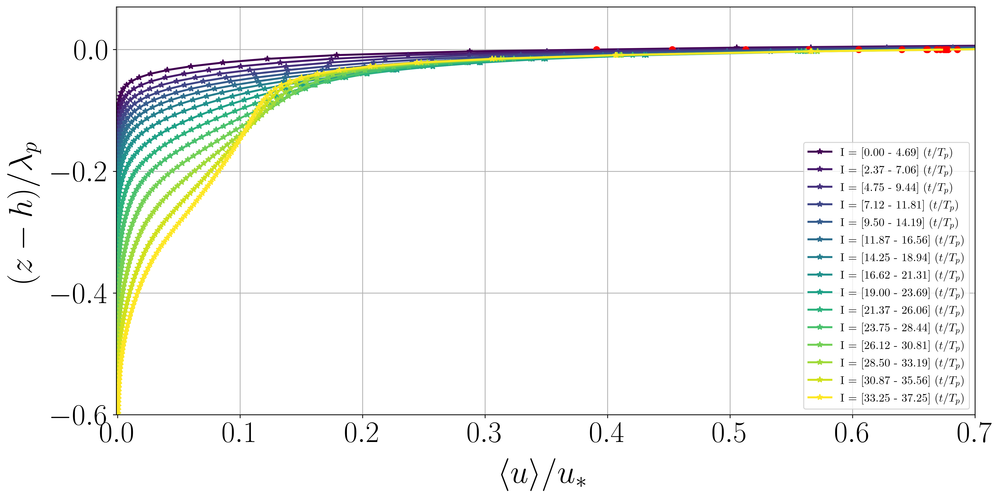

In [17]:
interval_length = time_normalized[idx_closest]

phi_avg = []
u_x_avg = []

for start, end in intervals:
    accumulated_u_x = None
    count = 0

    for i in range(start, end + 1):
        phi_str = profiles_df.at[i, 'phi']
        u_x_str = profiles_df.at[i, 'u.x']
        phi_array = np.array(ast.literal_eval(str(phi_str)))
        u_x_array = np.array(ast.literal_eval(str(u_x_str))) 

        if accumulated_u_x is None:
            accumulated_u_x = np.zeros_like(u_x_array)

        accumulated_u_x += u_x_array
        count += 1

    if count > 0:
        average_u_x = accumulated_u_x / count
    else:
        average_u_x = np.zeros_like(accumulated_u_x)

    phi_avg.append(phi_array) 
    u_x_avg.append(average_u_x)

lambdap = 2 * np.pi / kp
norm2 = lambdap

interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))
u = 0.25 
u_atzero = []

plt.figure(figsize=(14, 7))

for i, (phi, u_x) in enumerate(zip(phi_avg, u_x_avg)):
    start = intervals[i][0]
    end = intervals[i][1]
    interval_label = f"{time_normalized[start]:.2f} - {time_normalized[end]:.2f}"

    phi_normalized = phi - 1

    plt.plot(u_x / u, phi_normalized, lw=2, label=f"I = [{interval_label}]  $(t/T_{{p}})$", color=interval_colors[i], marker='*')

    if np.min(phi_normalized) <= 0 <= np.max(phi_normalized): 
        interp_func = interp1d(phi_normalized, u_x, kind='linear', fill_value="extrapolate")
        u_at_z0 = interp_func(0)
        u_atzero.append(u_at_z0)
        plt.plot(u_at_z0 / u, 0, 'ro') 

plt.xlim([-0.001, 0.7]) 
plt.ylim([-0.6, 0.07])

plt.ylabel(r'$(z-h)/\lambda_{p}$', labelpad=10)
plt.xlabel(r'$\langle u\rangle / u_{\ast}$', labelpad=10)
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/velocities/kpHs{kpHs}uoc{uoc}_meanwater.png')
plt.show()



[0.07846195 0.09630918 0.11133121 0.12455448 0.13650274 0.1474862
 0.15770656]


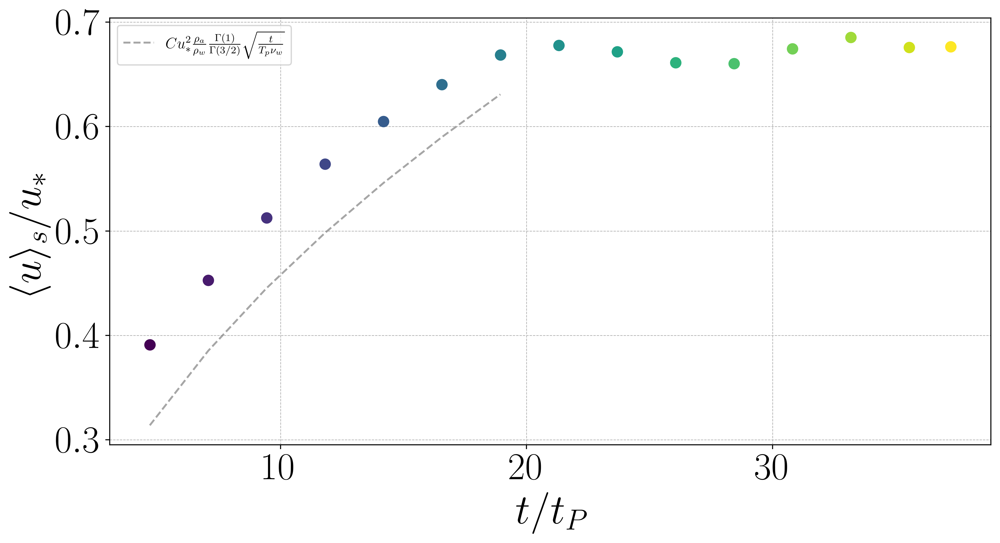

In [18]:
fig, ax = plt.subplots(figsize=(11, 6))

times_moyens = []
times_moyens_diss = []
interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))

for i, color in enumerate(interval_colors):
    start_time = time_normalized[intervals[i][0]]
    end_time = time_normalized[intervals[i][1]]
    time_moyen = (end_time) 

    ax.plot(time_moyen, u_atzero[i]/u, marker='o', linestyle='-', color=color, markersize=8, linewidth=2)
    if i<7:
        times_moyens_diss.append(time_moyen)
    times_moyens.append(time_moyen)

sqrt_times_moyen = np.sqrt(np.array(times_moyens))
max_u_atzero = np.max(u_atzero)
normalized_sqrt_times = sqrt_times_moyen * (max_u_atzero / max(sqrt_times_moyen))

vel_surf_predicted = 1.3*u**2 *rho_air/rho * special.gamma(1)/special.gamma(3/2)* np.sqrt(np.array(times_moyens_diss)*omegap/2*m.pi/nu_water)
print(vel_surf_predicted)
ax.plot(times_moyens_diss, vel_surf_predicted/u, ls='--', color='grey', alpha=0.7, label=r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$')


title_str = f'Velocity at the surface \quad kpHs= {ak} \quad  $ u_\\ast/c$={uoc_val}'
ax.set_xlabel(f'$t/t_{{P}}$')
ax.set_ylabel(r'$\langle u \rangle_{s} / u_{\ast}$')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(fontsize=12)

plt.tight_layout()
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/good/surface_velocity.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
phi_avg_array = np.array(phi_avg) - 1
u_x_avg_array = np.array(u_x_avg)
u_atzero_array = np.array(u_atzero)


print("Contenido original de phi_avg:")
print(phi_avg_array)
print("Contenido original de u_x_avg:")
print(u_x_avg_array)

trimmed_phi_avg_list = []
trimmed_u_x_avg_list = []

for i in range(len(phi_avg_array)):
    phi_profile = phi_avg_array[i]
    u_x_profile = u_x_avg_array[i]
    u_at_zero = u_atzero_array[i]

    print(f"Perfil {i}:")
    print(f"  phi_profile: {phi_profile}")
    print(f"  u_x_profile: {u_x_profile}")
    print(f"  u_at_zero: {u_at_zero}")

    cutoff_index = len(u_x_profile)
    tolerance = 1e-10
    for j in range(len(u_x_profile)):
        if u_x_profile[j] >= u_at_zero - tolerance:
            cutoff_index = j
            break

    trimmed_phi_profile = phi_profile[:cutoff_index]
    trimmed_u_x_profile = u_x_profile[:cutoff_index]

    print(f"  Índice de corte para perfil {i}: {cutoff_index}")
    print(f"  Perfil phi recortado: {trimmed_phi_profile}")
    print(f"  Perfil u_x recortado: {trimmed_u_x_profile}")

    trimmed_phi_avg_list.append(trimmed_phi_profile)
    trimmed_u_x_avg_list.append(trimmed_u_x_profile)

phi_avg_export = [list(phi) if len(phi) > 0 else [] for phi in trimmed_phi_avg_list]
ux_avg_export = [list(ux) if len(ux) > 0 else [] for ux in trimmed_u_x_avg_list]

data = {
    'phi_avg': phi_avg_export,
    'ux_avg': ux_avg_export,
    'time_moyens': times_moyens,
    'u_atzero': u_atzero
}

df_meanvelocity = pd.DataFrame(data)
df_meanvelocity.to_csv(f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv', index=False)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df_meanvelocity)


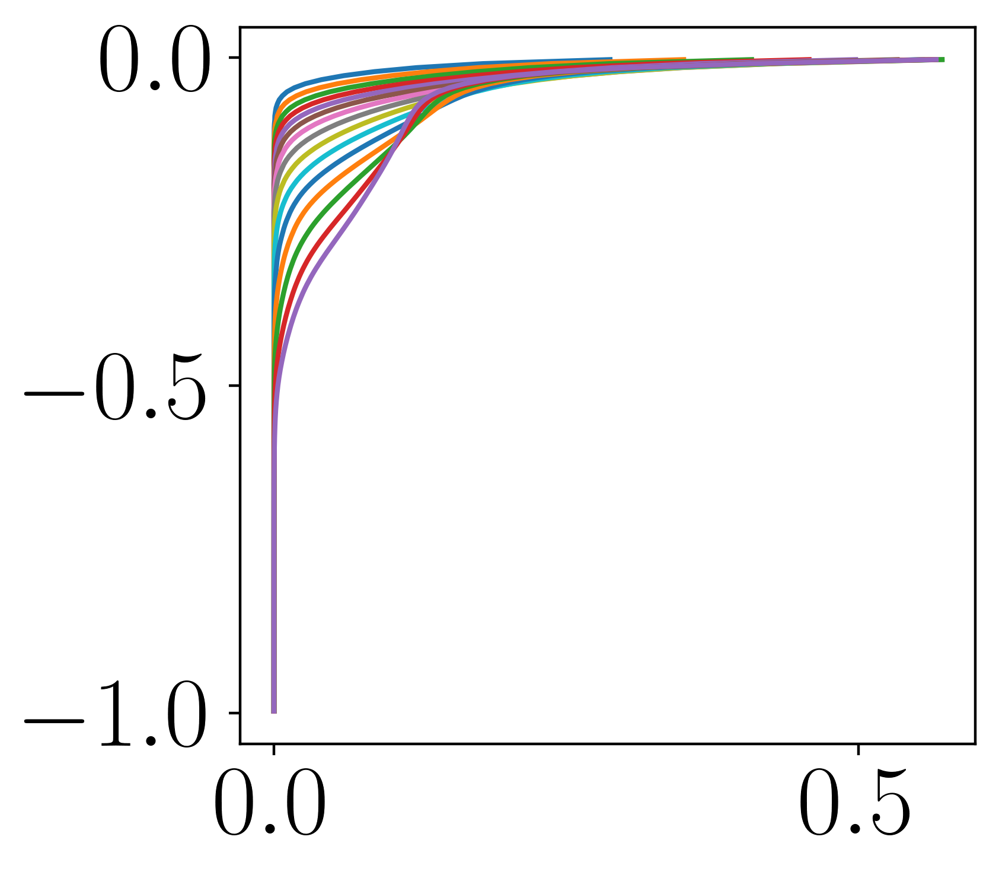

In [20]:
for i, (phi, ux) in enumerate(zip(df_meanvelocity['phi_avg'], df_meanvelocity['ux_avg'])):
    normalized_ux = [val / u for val in ux] 
    plt.plot(normalized_ux, phi, label=f'Intervalo {i + 1}')

plt.show()

[0.07846195 0.09630918 0.11133121 0.12455448 0.13650274 0.1474862
 0.15770656]


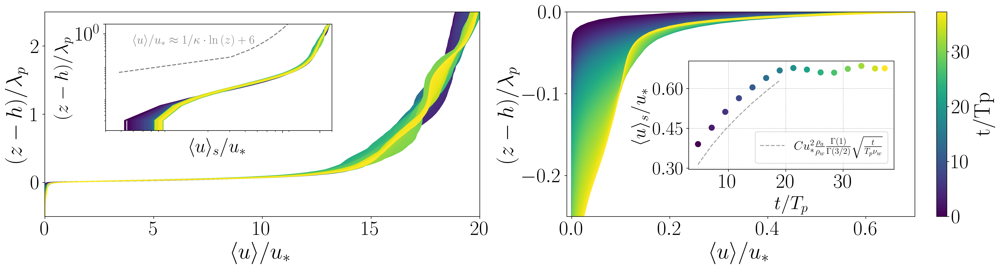

In [21]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28, 6)) 

plt.subplots_adjust(left=left_margin, right=right_margin, top=top_margin, bottom=bottom_margin)
norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array(time_normalized)

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)

ax1.set_xlim([-0.01, 20])
ax1.set_ylim(ylim_air)
ax1.set_ylabel(r'$(z-h)/\lambda_{p}$')
ax1.set_xlabel(r'$\langle u\rangle / u_{\ast}$')

inset_ax1 = ax1.inset_axes([0.14, 0.42, 0.52, 0.52])

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))

    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    inset_ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)

kappa = 0.41 
B = 6 
u_star = 0.25 
inset_ax1.text(0.5, 0.5, r'$\langle u \rangle/u_{*} \approx 1/\kappa \cdot \ln \left(z\right) + 6$', fontsize=18, color='grey')

z_log = np.linspace(0.1, 20, 100) 

u_log = (1/kappa) * np.log(z_log) + B

inset_ax1.plot(u_log, z_log/lambdap, '--', color='grey')

inset_ax1.set_xlim([0.3, 20]) 
inset_ax1.set_ylim([10**(-3), 2])  
inset_ax1.set_xscale('log')
inset_ax1.set_yscale('log')
# inset_ax1.xaxis.set_major_locator(MaxNLocator(nbins=4))  
inset_ax1.yaxis.set_major_locator(MaxNLocator(nbins=1)) 

inset_ax2 = ax2.inset_axes([0.35, 0.23, 0.59, 0.53]) 

times_moyens_diss = []


interval_labels =[]
for i, color in enumerate(interval_colors):
    time_moyen = time_normalized[intervals[i][1]] 
    interval_labels.append(f"Interval {i}")
    if i< 7:
        times_moyens_diss.append(time_moyen)
    
    times_moyens.append(time_moyen)
    #if i < 4:
    inset_ax2.plot(time_moyen, u_atzero[i]/u, marker='o', linestyle='-', color=color, markersize=8, linewidth=2)
    
vel_surf_predicted = 1.3*u**2 *rho_air/rho * special.gamma(1)/special.gamma(3/2)* np.sqrt(np.array(times_moyens[0:7])*omegap/2*m.pi/nu_water)
print(vel_surf_predicted)
inset_ax2.plot(times_moyens[0:7], vel_surf_predicted/u, ls='--', color='grey', alpha=0.7, label=r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$')


for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = np.sqrt(8*nu_water*(time_normalized[i]-time_normalized[0]))
    norm2 = lambdap
    ax2.plot(u_z_array/u, (phi_array-1)/norm2, color=color)

cbar2 = plt.colorbar(sm, ax=ax2)
cbar2.set_label('t/Tp')

ax2.set_xlim([-0.01,0.7])
ax2.set_ylim([-0.25,0])
ax2.set_ylabel(r'$(z-h)/\lambda_p$')
ax2.set_xlabel(r'$\langle u\rangle / u_* $')
ax2.axhline(y=0, color='grey', linestyle='--', lw=0.8)
ax2.yaxis.set_major_locator(MaxNLocator(nbins=3))

inset_ax2.set_ylabel(r'$\langle u \rangle_{s} / u_{\ast}$', fontsize=28)
inset_ax1.set_xlabel(r'$\langle u \rangle_{s} / u_{\ast}$', fontsize=28)
inset_ax1.set_ylabel(r'$(z-h)/\lambda_p$', fontsize=28)
#inset_ax2.set_xticks(times_moyens)
inset_ax2.tick_params(axis='y', labelsize=28) 
#inset_ax2.set_xticks([])
inset_ax2.set_xlabel(r'$t / T_{p}$', fontsize=28)
#inset_ax2.set_xticklabels(interval_labels, rotation=45, ha='right', fontsize=15)
inset_ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
inset_ax2.yaxis.set_major_locator(MaxNLocator(nbins=3))
inset_ax1.xaxis.set_major_locator(MaxNLocator(nbins=3))
inset_ax2.legend(fontsize=18)

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/good/velocity_combined.png', dpi=300, bbox_inches='tight')

plt.show()


In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 12), sharex=False, gridspec_kw={'height_ratios': [1, 1]})
plt.subplots_adjust(hspace=0.29, right=0.85)

norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)

ax1.set_xlim([-0.01, 20])
ax1.set_ylim(ylim_air)
ax1.set_ylabel(r'$(z-h)/\lambda_{p}$')
ax1.set_xlabel(r'$\langle u\rangle / u_{\ast}$')

inset_ax1 = ax1.inset_axes([0.14, 0.42, 0.52, 0.52])
for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))

    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    inset_ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)


kappa = 0.41  
B = 6.5 
z_log = np.linspace(0.1, 20, 100)  
u_log = (1/kappa) * np.log(z_log) + B
inset_ax1.plot(u_log, z_log/lambdap, '--', color='grey')
inset_ax1.text(0.5, 0.5, r'$\langle u \rangle/u_{*} \approx 1/\kappa \cdot \ln \left(z\right) + 6$', fontsize=12, color='grey')

inset_ax1.set_xlim([0.3, 20])
inset_ax1.set_ylim([10**(-3), 2])
inset_ax1.set_xscale('log')
inset_ax1.set_yscale('log')
inset_ax1.yaxis.set_major_locator(MaxNLocator(nbins=1)) 

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = np.sqrt(8 * nu_water * (time_normalized[i] - time_normalized[0]))
    norm2 = lambdap
    ax2.plot(u_z_array/u, (phi_array-1)/norm2, color=color)

ax2.set_xlim([-0.01, 0.7])
ax2.set_ylim([-0.25, 0])
ax2.set_ylabel(r'$(z-h)/\lambda_p$')
ax2.set_xlabel(r'$\langle u\rangle / u_* $')
ax2.axhline(y=0, color='grey', linestyle='--', lw=0.8)
ax2.yaxis.set_major_locator(MaxNLocator(nbins=3))

inset_ax2 = ax2.inset_axes([0.35, 0.29, 0.57, 0.51])
for i, color in enumerate(interval_colors):
    time_moyen = time_normalized[intervals[i][1]]
    inset_ax2.plot(time_moyen, u_atzero[i]/u, marker='o', linestyle='-', color=color, markersize=8, linewidth=2)

vel_surf_predicted = 1.3*u**2 *rho_air/rho * special.gamma(1)/special.gamma(3/2)* np.sqrt(np.array(times_moyens[0:7])*omegap/2*m.pi/nu_water)
inset_ax2.plot(times_moyens[0:7], vel_surf_predicted/u, ls='--', color='grey', alpha=0.7, label=r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$')

inset_ax2.set_ylabel(r'$\langle u \rangle_{s} / u_{\ast}$', fontsize=24)
inset_ax2.set_xlabel(r'$t / T_{p}$', fontsize=24)
inset_ax2.text(15, 0.45, r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$', fontsize=15, color='grey')

cbar = fig.colorbar(sm, ax=[ax1, ax2], orientation='vertical', pad=0.035, aspect=50)
cbar.set_label('t/Tp')

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/kpHs{kpHs}uoc{uoc}/velocity_combined_with_inset_y.png', dpi=300, bbox_inches='tight')

plt.show()


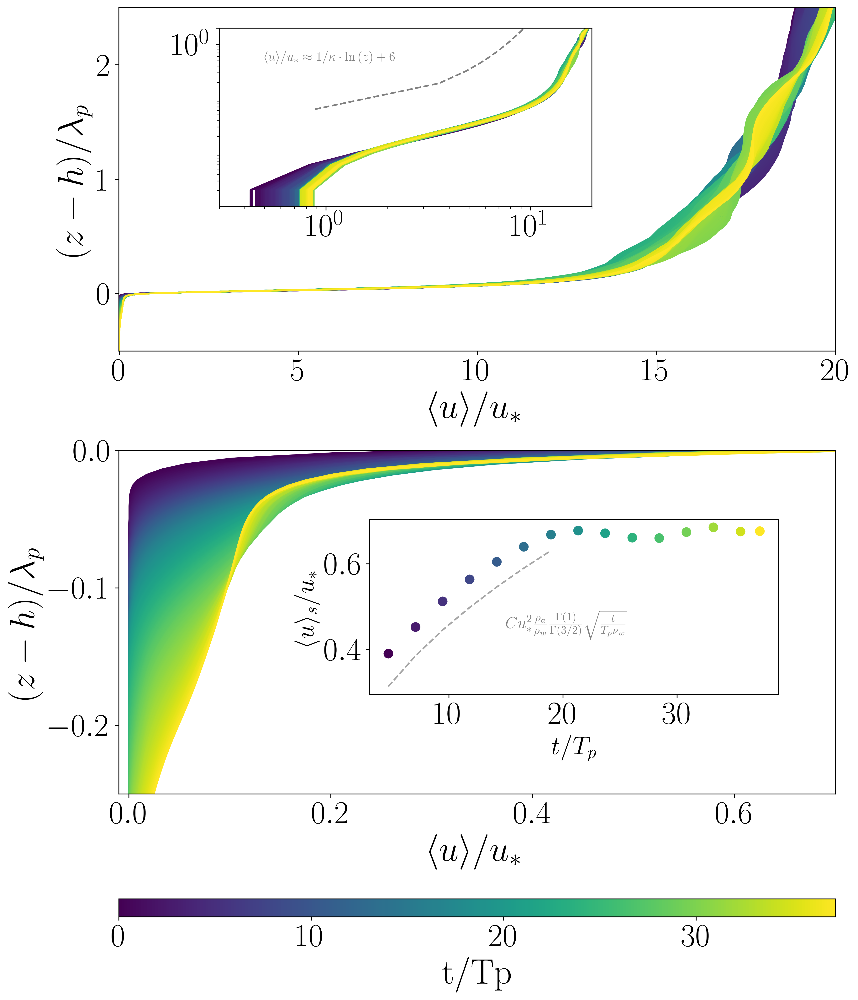

In [23]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 18), sharex=False, gridspec_kw={'height_ratios': [1, 1]})
plt.subplots_adjust(hspace=0.29)  
norm = Normalize(vmin=np.min(time_normalized), vmax=np.max(time_normalized))

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)

ax1.set_xlim([-0.01, 20])
ax1.set_ylim(ylim_air)
ax1.set_ylabel(r'$(z-h)/\lambda_{p}$')
ax1.set_xlabel(r'$\langle u\rangle / u_{\ast}$')

inset_ax1 = ax1.inset_axes([0.14, 0.42, 0.52, 0.52])
for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))

    color = sm.to_rgba(time_normalized[i])
    norm = lambdap
    inset_ax1.plot(u_z_array/u, (phi_array-1)/norm, color=color)

kappa = 0.41  
B = 6.5 
z_log = np.linspace(0.1, 20, 100) 
u_log = (1/kappa) * np.log(z_log) + B
inset_ax1.plot(u_log, z_log/lambdap, '--', color='grey')
inset_ax1.text(0.5, 0.5, r'$\langle u \rangle/u_{*} \approx 1/\kappa \cdot \ln \left(z\right) + 6$', fontsize=12, color='grey')

inset_ax1.set_xlim([0.3, 20])
inset_ax1.set_ylim([10**(-3), 2])
inset_ax1.set_xscale('log')
inset_ax1.set_yscale('log')
inset_ax1.yaxis.set_major_locator(MaxNLocator(nbins=1)) 

for i in range(min(len(profiles_df), len(time_normalized))):
    phi_str = profiles_df.at[i, 'phi']
    u_z_str = profiles_df.at[i, 'u.x']
    phi_array = np.array(ast.literal_eval(str(phi_str)))
    u_z_array = np.array(ast.literal_eval(str(u_z_str)))
    
    color = sm.to_rgba(time_normalized[i])
    norm = np.sqrt(8 * nu_water * (time_normalized[i] - time_normalized[0]))
    norm2 = lambdap
    ax2.plot(u_z_array/u, (phi_array-1)/norm2, color=color)

ax2.set_xlim([-0.01, 0.7])
ax2.set_ylim([-0.25, 0])
ax2.set_ylabel(r'$(z-h)/\lambda_p$')
ax2.set_xlabel(r'$\langle u\rangle / u_* $')
ax2.axhline(y=0, color='grey', linestyle='--', lw=0.8)
ax2.yaxis.set_major_locator(MaxNLocator(nbins=3))

inset_ax2 = ax2.inset_axes([0.35, 0.29, 0.57, 0.51])
for i, color in enumerate(interval_colors):
    time_moyen = time_normalized[intervals[i][1]]
    inset_ax2.plot(time_moyen, u_atzero[i]/u, marker='o', linestyle='-', color=color, markersize=8, linewidth=2)

vel_surf_predicted = 1.3*u**2 *rho_air/rho * special.gamma(1)/special.gamma(3/2)* np.sqrt(np.array(times_moyens[0:7])*omegap/2*m.pi/nu_water)
inset_ax2.plot(times_moyens[0:7], vel_surf_predicted/u, ls='--', color='grey', alpha=0.7, label=r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$')

inset_ax2.set_ylabel(r'$\langle u \rangle_{s} / u_{\ast}$', fontsize=24)
inset_ax2.set_xlabel(r'$t / T_{p}$', fontsize=24)
inset_ax2.text(15, 0.45, r'$ C u_{*}^2 \frac{\rho_{a}}{\rho_{w}} \frac{\Gamma(1)}{\Gamma(3/2)}  \sqrt{\frac{t}{T_{p}\nu_w}}$', fontsize=15, color='grey')

cbar = fig.colorbar(sm, ax=[ax1, ax2], orientation='horizontal', pad=0.1, aspect=40)
cbar.set_label('t/Tp')

plt.savefig(f'/projects/DEIKE/cmartinb/graphs/paper2024/kpHs{kpHs}uoc{uoc}/velocity_combined_with_insets.png', dpi=300, bbox_inches='tight')

plt.show()


In [24]:
import numpy as np

phi_avg_array = np.array(phi_avg) - 1  
u_x_avg_array = np.array(u_x_avg)
u_atzero_array = np.array(u_atzero) 

trimmed_phi_avg_list = []
trimmed_u_x_avg_list = []


for i in range(len(phi_avg_array)):
    phi_profile = phi_avg_array[i]
    u_x_profile = u_x_avg_array[i]
    u_at_zero = u_atzero_array[i]

    cutoff_index = len(u_x_profile)

    for j in range(len(u_x_profile)):
        if u_x_profile[j] <= u_at_zero:
            cutoff_index = j

    trimmed_phi_profile = phi_profile[:cutoff_index+1] 
    trimmed_u_x_profile = u_x_profile[:cutoff_index+1]
    
    trimmed_phi_avg_list.append(trimmed_phi_profile)
    trimmed_u_x_avg_list.append(trimmed_u_x_profile)

water_phi_avg_array = np.array(trimmed_phi_avg_list, dtype=object)
water_u_x_avg_array = np.array(trimmed_u_x_avg_list, dtype=object)

print("\nTrimmed phi_avg_array:", water_phi_avg_array)
print("Trimmed u_x_avg_array:", water_u_x_avg_array)



Trimmed phi_avg_array: [[-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]
 [-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]
 [-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]
 ...
 [-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]
 [-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]
 [-0.996932038 -0.990796115 -0.98466019 ... -0.01518430000000004
  -0.009048399999999956 -0.0029124999999999845]]
Trimmed u_x_avg_array: [[4.85761652e-08 4.85761652e-08 4.85761652e-08 ... 0.030549331052631568
  0.04470746894736843 0.0718536509210526]
 [7.335941764736841e-08 7.335941764736841e-08 7.335941764736841e-08 ...
  0.043646795921052625 0.05927141065789474 0.08760259210526314]
 [9.317284605263159

In [25]:
'''
data = {
    'phi_avg': [list(phi) for phi in water_phi_avg_array], 
    'ux_avg': [list(ux) for ux in water_u_x_avg_array], 
    'time_moyens': times_moyens, 
    'u_atzero': u_atzero
}

df_meanvelocity = pd.DataFrame(data)

df_meanvelocity.to_csv(f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv', index=False)

print(df_meanvelocity)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df_meanvelocity)
'''

"\ndata = {\n    'phi_avg': [list(phi) for phi in water_phi_avg_array], \n    'ux_avg': [list(ux) for ux in water_u_x_avg_array], \n    'time_moyens': times_moyens, \n    'u_atzero': u_atzero\n}\n\ndf_meanvelocity = pd.DataFrame(data)\n\ndf_meanvelocity.to_csv(f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv', index=False)\n\nprint(df_meanvelocity)\nwith pd.option_context('display.max_rows', None, 'display.max_columns', None):\n    print(df_meanvelocity)\n"

In [26]:
'''
data = {
    'phi_avg':  water_phi_avg_array,
    'ux_avg': water_u_x_avg_array,
    'time_moyens': times_moyens,
    'u_atzero' : u_atzero
}


# Create a DataFrame from the dictionary
df_meanvelocity = pd.DataFrame(data)
df_meanvelocity.to_csv(f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv', index=False)
print(df_meanvelocity)
'''

"\ndata = {\n    'phi_avg':  water_phi_avg_array,\n    'ux_avg': water_u_x_avg_array,\n    'time_moyens': times_moyens,\n    'u_atzero' : u_atzero\n}\n\n\n# Create a DataFrame from the dictionary\ndf_meanvelocity = pd.DataFrame(data)\ndf_meanvelocity.to_csv(f'/projects/DEIKE/cmartinb/mean_velocity/mean_velocity_kpHs{kpHs}_uoc{uoc}.csv', index=False)\nprint(df_meanvelocity)\n"

### Mean velocity profile

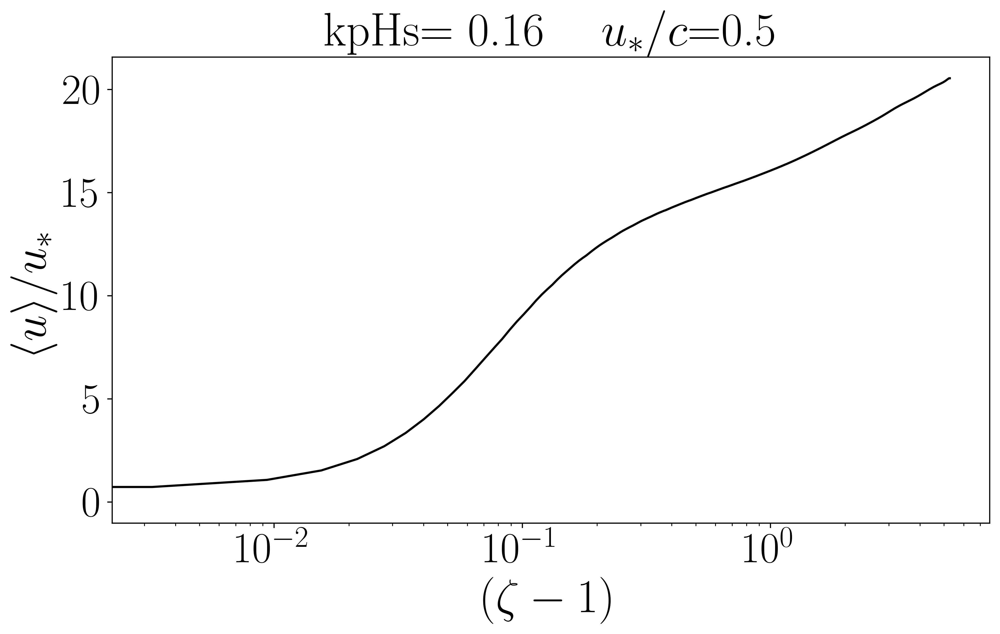

In [27]:
fig, ax = plt.subplots(figsize=[11, 6])
norm = Normalize(vmin=0, vmax=299)
sm = plt.cm.ScalarMappable(cmap=viridis, norm=norm)
sm.set_array([])

accumulated_u_z = np.zeros_like(np.array(ast.literal_eval(profiles_df.at[0, 'u.x'])))

for i in range(len(profiles_df)):
    u_z_str = profiles_df.at[i, 'u.x']
    u_z_array = np.array(ast.literal_eval(u_z_str))
    accumulated_u_z += u_z_array

average_u_z = accumulated_u_z / len(profiles_df)

ax.plot(phi_array-1, average_u_z/(0.25**1), color='black')  # color='black' para la línea promedio

plt.xscale('log')
plt.xlabel(r'$(\zeta - 1) $')
plt.ylabel(r'$\langle u\rangle /u_\ast$')
ax2.yaxis.set_major_locator(MaxNLocator(nbins=3))
title_str = f'kpHs= {ak} \quad  $ u_\\ast/c$={uoc_val}'
ax.set_title(title_str)

plt.show()

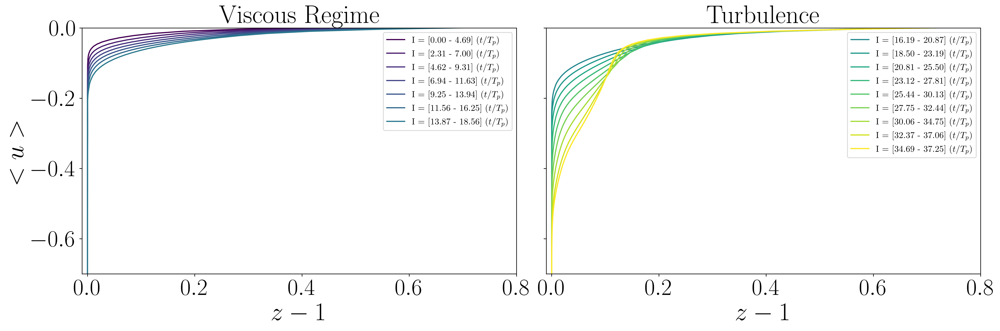

In [28]:
target = 4.66 
idx_closest = np.argmin(np.abs(time_normalized - target))
interval_length = int(idx_closest)  
overlap_fraction = 0.5

intervals = []
start_idx = 0
end_idx = idx_closest
intervals.append((start_idx, end_idx))

while end_idx < len(time_normalized) - 1:
    start_idx = int(end_idx - overlap_fraction * interval_length)
    end_idx = start_idx + interval_length
    if end_idx >= len(time_normalized):
        end_idx = len(time_normalized) - 1
    intervals.append((start_idx, end_idx))

phi_avg = []
velocities_avg = []

for start, end in intervals:
    accumulated_velocities = None
    count = 0

    for i in range(start, end + 1):
        phi_array = np.array(ast.literal_eval(profiles_df.at[i, 'phi']))
        uv_array = np.array(ast.literal_eval(profiles_df.at[i, 'uv']))
        u_x_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.x']))
        u_z_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.y']))

        if accumulated_velocities is None:
            accumulated_velocities = np.zeros_like(u_x_array)
        accumulated_velocities += u_x_array/u
        count += 1

    average_velocities = accumulated_velocities / count if count > 0 else np.zeros_like(accumulated_fluctuations)
    velocities_avg.append(average_velocities)
    phi_avg.append(phi_array - 1)  

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))

for i, (phi, avg_velocities) in enumerate(zip(phi_avg[:7], velocities_avg[:7])):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax1.plot(avg_velocities, phi,  color=interval_colors[i], label=f"I = [{interval_label}]  $(t/T_{{p}})$")

ax1.set_xlim([-0.01,0.8])
ax1.set_ylim([-0.7,0])
ax1.set_xlabel(r'$z-1$')
ax1.set_ylabel(r'$<u>$')
ax1.set_title('Viscous Regime')
ax1.legend()

for i, (phi, avg_velocities) in enumerate(zip(phi_avg[7:], velocities_avg[7:]), start=7):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax2.plot(avg_velocities, phi, color=interval_colors[i], label=f"I = [{interval_label}]  $(t/T_{{p}})$")

ax2.set_xlim([-0.01,0.8])
ax2.set_ylim([-0.7,0])
ax2.set_xlabel(r'$z-1$')
ax2.set_title('Turbulence')
ax2.legend()

plt.tight_layout()
plt.show()

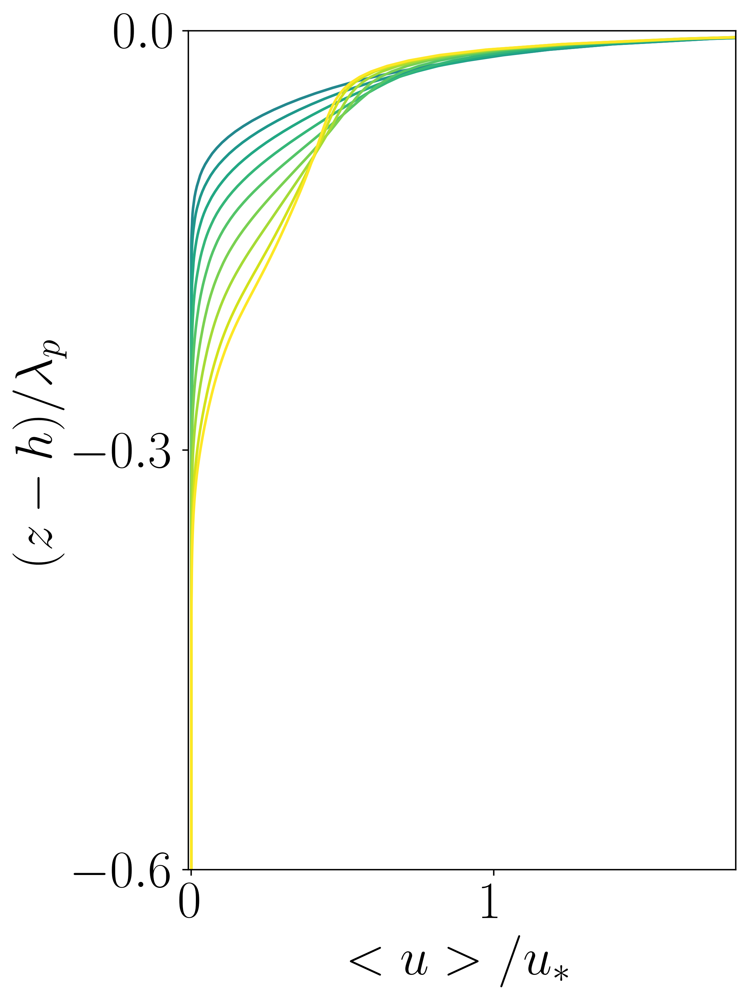

In [29]:
fig, ax2 = plt.subplots(figsize=[6, 8])
for i, (phi, avg_velocities) in enumerate(zip(phi_avg[7:], velocities_avg[7:]), start=7):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax2.plot(avg_velocities/u, phi/lambdap, color=interval_colors[i], label=f"I = [{interval_label}]  $(t/T_{{p}})$")

ax2.set_xlim([-0.01,1.8])
ax2.set_ylim([-0.6,0])
ax2.set_xlabel(r'$<u>/u_{*}$', fontsize = 30)
ax2.set_ylabel(r'$(z-h)/\lambda_p$', fontsize = 30)

ax2.yaxis.set_major_locator(MaxNLocator(nbins=2))

plt.tight_layout()
plt.show()

# Velocity fluctuations

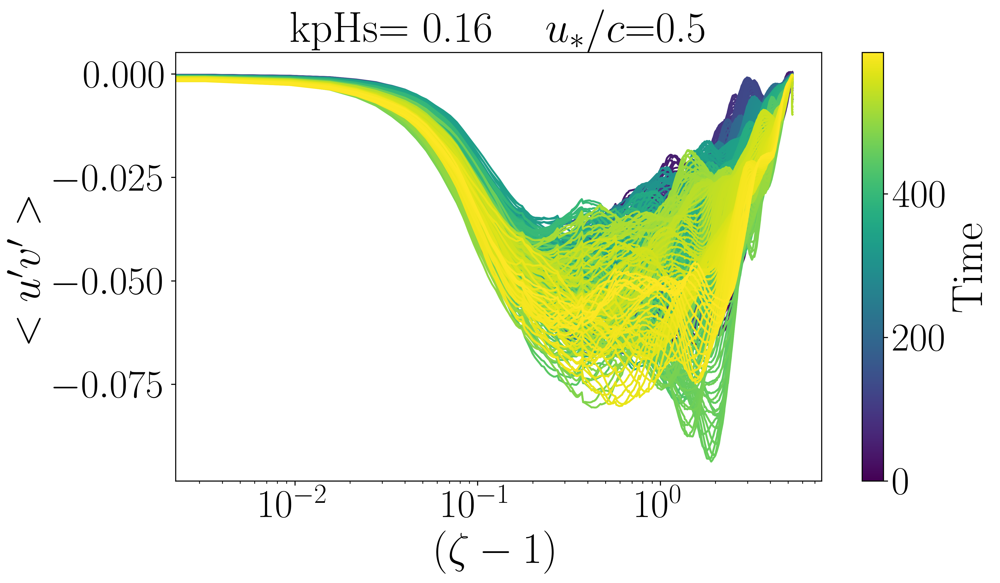

In [38]:
fig, ax = plt.subplots(figsize=[11, 6])
norm = Normalize(vmin=0, vmax=len(profiles_df))
sm = plt.cm.ScalarMappable(cmap=viridis, norm=norm)
sm.set_array([]) 

# 'phi', 'uv', 'u.x' y 'u.z' 
for i in range(len(profiles_df)):
    phi_array = np.array(ast.literal_eval(profiles_df.at[i, 'phi']))
    uv_array = np.array(ast.literal_eval(profiles_df.at[i, 'uv']))
    u_x_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.x']))
    u_z_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.y']))

    # Calcul fluctuations
    fluctuations_array = uv_array - u_x_array * u_z_array
    calc_array = (phi_array - 1) * 720
    # Color as time
    color = sm.to_rgba(i)
    ax.plot((phi_array - 1) , fluctuations_array, color=color)

cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Time')
ax.set_xscale('log')  
ax.set_xlabel(r'$(\zeta - 1)$')
ax.set_ylabel(r'$<u^\prime v^\prime>$')
title_str = f'kpHs= {ak} \quad  $ u_\\ast/c$={uoc_val}'
ax.set_title(title_str)
plt.show()

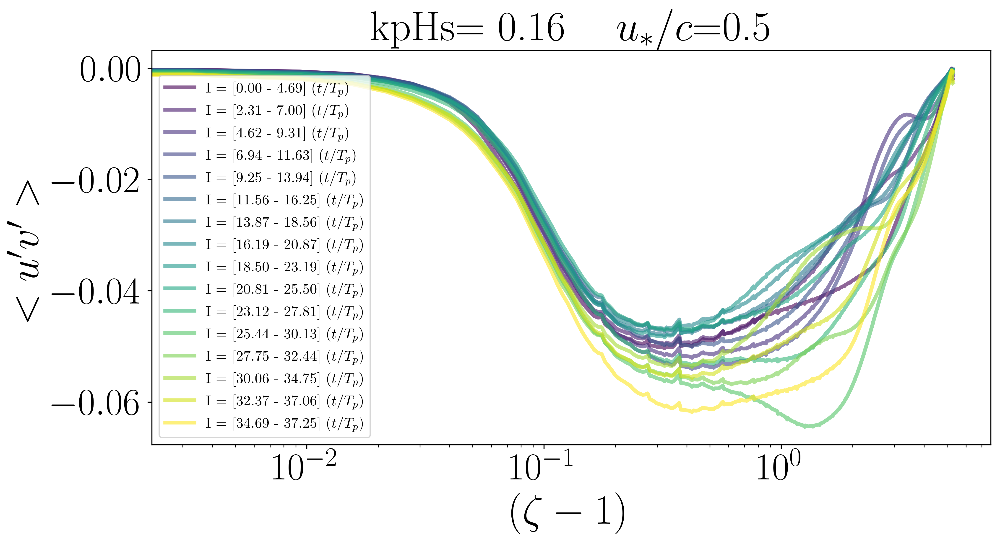

In [35]:
idx_closest = np.argmin(np.abs(time_normalized - target))
interval_length = int(idx_closest)  # Longitud en índices
overlap_fraction = 0.5

intervals = []
start_idx = 0
end_idx = idx_closest
intervals.append((start_idx, end_idx))

while end_idx < len(time_normalized) - 1:
    start_idx = int(end_idx - overlap_fraction * interval_length)
    end_idx = start_idx + interval_length
    if end_idx >= len(time_normalized):
        end_idx = len(time_normalized) - 1
    intervals.append((start_idx, end_idx))

phi_avg = []
fluctuations_avg = []

for start, end in intervals:
    accumulated_fluctuations = None
    count = 0

    for i in range(start, end + 1):
        phi_array = np.array(ast.literal_eval(profiles_df.at[i, 'phi']))
        uv_array = np.array(ast.literal_eval(profiles_df.at[i, 'uv']))
        u_x_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.x']))
        u_z_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.y']))

        fluctuations_array = uv_array - u_x_array * u_z_array
        if accumulated_fluctuations is None:
            accumulated_fluctuations = np.zeros_like(fluctuations_array)
        accumulated_fluctuations += fluctuations_array
        count += 1

    average_fluctuations = accumulated_fluctuations / count if count > 0 else np.zeros_like(accumulated_fluctuations)
    fluctuations_avg.append(average_fluctuations)
    phi_avg.append(phi_array - 1)  

fig, ax = plt.subplots(figsize=[11, 6])
interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))

for i, (phi, avg_fluctuations) in enumerate(zip(phi_avg, fluctuations_avg)):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax.plot(phi, avg_fluctuations, color=interval_colors[i], lw = 3, alpha = 0.6,  label=f"I = [{interval_label}]  $(t/T_{{p}})$")

ax.set_xscale('log')
ax.set_xlabel(r'$(\zeta - 1)$')
ax.set_ylabel(r'$<u^\prime v^\prime>$')
title_str = f'kpHs= {ak} \quad  $ u_\\ast/c$={uoc_val}'
ax.set_title(title_str)

plt.legend()
plt.tight_layout()
plt.show()

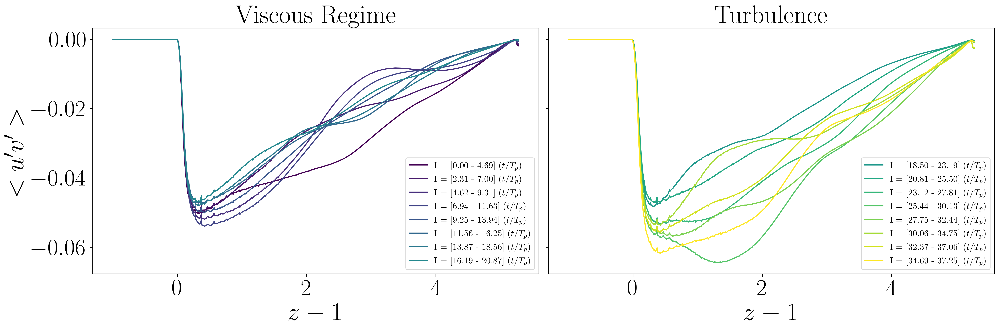

In [36]:
target = 4.66  # 2T0
idx_closest = np.argmin(np.abs(time_normalized - target))
interval_length = int(idx_closest)  
overlap_fraction = 0.5

intervals = []
start_idx = 0
end_idx = idx_closest
intervals.append((start_idx, end_idx))

while end_idx < len(time_normalized) - 1:
    start_idx = int(end_idx - overlap_fraction * interval_length)
    end_idx = start_idx + interval_length
    if end_idx >= len(time_normalized):
        end_idx = len(time_normalized) - 1
    intervals.append((start_idx, end_idx))

phi_avg = []
fluctuations_avg = []

for start, end in intervals:
    accumulated_fluctuations = None
    count = 0

    for i in range(start, end + 1):
        phi_array = np.array(ast.literal_eval(profiles_df.at[i, 'phi']))
        uv_array = np.array(ast.literal_eval(profiles_df.at[i, 'uv']))
        u_x_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.x']))
        u_z_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.y']))

        fluctuations_array = uv_array - u_x_array * u_z_array
        if accumulated_fluctuations is None:
            accumulated_fluctuations = np.zeros_like(fluctuations_array)
        accumulated_fluctuations += fluctuations_array
        count += 1

    average_fluctuations = accumulated_fluctuations / count if count > 0 else np.zeros_like(accumulated_fluctuations)
    fluctuations_avg.append(average_fluctuations)
    phi_avg.append(phi_array - 1) 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
interval_colors = plt.cm.viridis(np.linspace(0, 1, len(intervals)))

for i, (phi, avg_fluctuations) in enumerate(zip(phi_avg[:8], fluctuations_avg[:8])):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax1.plot(phi, avg_fluctuations, color=interval_colors[i], label=f"I = [{interval_label}]  $(t/T_{{p}})$")


ax1.set_xlabel(r'$z-1$')
ax1.set_ylabel(r'$<u^\prime v^\prime>$')
ax1.set_title('Viscous Regime')
ax1.legend()

for i, (phi, avg_fluctuations) in enumerate(zip(phi_avg[8:], fluctuations_avg[8:]), start=8):
    interval_label = f"{time_normalized.iloc[intervals[i][0]]:.2f} - {time_normalized.iloc[intervals[i][1]]:.2f}"
    ax2.plot( phi, avg_fluctuations,color=interval_colors[i], label=f"I = [{interval_label}]  $(t/T_{{p}})$")

ax2.set_xlabel(r'$z-1$')
ax2.set_title('Turbulence')
ax2.legend()

plt.tight_layout()
plt.show()


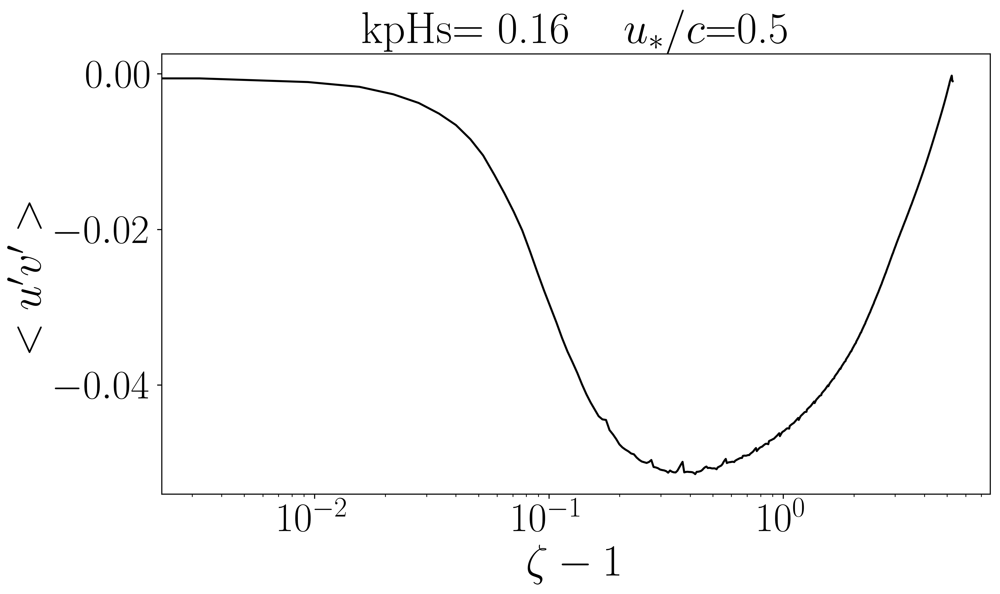

In [37]:
#MEAN FLUCTUATIONS

fig, ax = plt.subplots(figsize=[11, 6])

accumulated_fluctuations = None

for i in range(len(profiles_df)):
    phi_array = np.array(ast.literal_eval(profiles_df.at[i, 'phi']))
    uv_array = np.array(ast.literal_eval(profiles_df.at[i, 'uv']))
    u_x_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.x']))
    u_z_array = np.array(ast.literal_eval(profiles_df.at[i, 'u.y']))

    fluctuations_array = uv_array - u_x_array * u_z_array
    if accumulated_fluctuations is None:
        accumulated_fluctuations = np.zeros_like(fluctuations_array)
    accumulated_fluctuations += fluctuations_array

average_fluctuations = accumulated_fluctuations / len(profiles_df)

calc_array = (np.array(ast.literal_eval(profiles_df.at[0, 'phi'])) - 1) * 720

ax.plot(phi_array-1, average_fluctuations, color='black', label='Average Fluctuations')
ax.set_xscale('log')
ax.set_xlabel(r'$\zeta -1 $')
ax.set_ylabel(r'$<u^\prime v^\prime>$')
title_str = f'kpHs= {ak} \quad  $ u_\\ast/c$={uoc_val}'
ax.set_title(title_str)

plt.show()